In [1]:
%cd /content
!git clone https://github.com/timojl/clipseg.git

# Commits on Sep 27, 2022
%cd /content/clipseg
!git checkout 515ca6ec2d066d447240c1dd79f3bbbee685bd29

/content
Cloning into 'clipseg'...
remote: Enumerating objects: 226, done.
remote: Counting objects: 100% (85/85), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 226 (delta 66), reused 51 (delta 51), pack-reused 141
Receiving objects: 100% (226/226), 1.40 MiB | 6.16 MiB/s, done.
Resolving deltas: 100% (123/123), done.
/content/clipseg
Note: switching to '515ca6ec2d066d447240c1dd79f3bbbee685bd29'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by switching back to a branch.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -c with the switch command. Example:

  git switch -c <new-branch-name>

Or undo this operation with:

  git switch -

Turn off this advice by setting config variable advice.detachedHead to false

HEAD is now at 515ca6e added samples for fine-grained weights

In [2]:
!pip install git+https://github.com/openai/CLIP.git@d50d76daa670286dd6cacf3bcd80b5e4823fc8e1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/openai/CLIP.git (to revision d50d76daa670286dd6cacf3bcd80b5e4823fc8e1) to /tmp/pip-req-build-1tt1q809
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-1tt1q809
  Running command git rev-parse -q --verify 'sha^d50d76daa670286dd6cacf3bcd80b5e4823fc8e1'
  Running command git fetch -q https://github.com/openai/CLIP.git d50d76daa670286dd6cacf3bcd80b5e4823fc8e1
  Running command git checkout -q d50d76daa670286dd6cacf3bcd80b5e4823fc8e1
  Resolved https://github.com/openai/CLIP.git to commit d50d76daa670286dd6cacf3bcd80b5e4823fc8e1
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 3.5 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369398 sha256=8362517f3f91663acb1bc665017c01c51a422dc21d1d06f190a4c4e2df91e3e7
  Stored in dir

In [3]:
%cd /content/clipseg

import os

import torch
import requests

from models.clipseg import CLIPDensePredT
from PIL import Image
from torchvision import transforms
from matplotlib import pyplot as plt

device = 'cuda' if torch.cuda.is_available() else "cpu"
print("using device is", device)

/content/clipseg
using device is cuda


In [4]:
# %cd /content/clipseg
!mkdir pretrained


!wget https://owncloud.gwdg.de/index.php/s/ioHbRzFx6th32hn/download -O pretrained/weights.zip
!unzip -d pretrained/weights -j pretrained/weights.zip

--2023-05-06 22:09:40--  https://owncloud.gwdg.de/index.php/s/ioHbRzFx6th32hn/download
Resolving owncloud.gwdg.de (owncloud.gwdg.de)... 134.76.23.45
Connecting to owncloud.gwdg.de (owncloud.gwdg.de)|134.76.23.45|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘pretrained/weights.zip’

pretrained/weights.     [           <=>      ]   9.68M  4.63MB/s    in 2.1s    

2023-05-06 22:09:44 (4.63 MB/s) - ‘pretrained/weights.zip’ saved [10146905]

Archive:  pretrained/weights.zip
 extracting: pretrained/weights/rd16-uni.pth  
 extracting: pretrained/weights/rd64-uni-refined.pth  
 extracting: pretrained/weights/rd64-uni.pth  


In [5]:
# %cd /content/clipseg

# load model
model = CLIPDensePredT(version='ViT-B/16', reduce_dim=64)
model.eval();

model.load_state_dict(torch.load('pretrained/weights/rd64-uni.pth', map_location=torch.device(device)), strict=False);

100%|████████████████████████████████████████| 335M/335M [00:01<00:00, 253MiB/s]


In [6]:
!wget -c https://www.pakutaso.com/shared/img/thumb/kotetsuPAR583412044_TP_V4.jpg \
      -O test_01.jpg

--2023-05-06 22:10:04--  https://www.pakutaso.com/shared/img/thumb/kotetsuPAR583412044_TP_V4.jpg
Resolving www.pakutaso.com (www.pakutaso.com)... 180.235.251.31
Connecting to www.pakutaso.com (www.pakutaso.com)|180.235.251.31|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 223725 (218K) [image/jpeg]
Saving to: ‘test_01.jpg’

test_01.jpg         100%[===================>] 218.48K   981KB/s    in 0.2s    

2023-05-06 22:10:05 (981 KB/s) - ‘test_01.jpg’ saved [223725/223725]



/content/clipseg


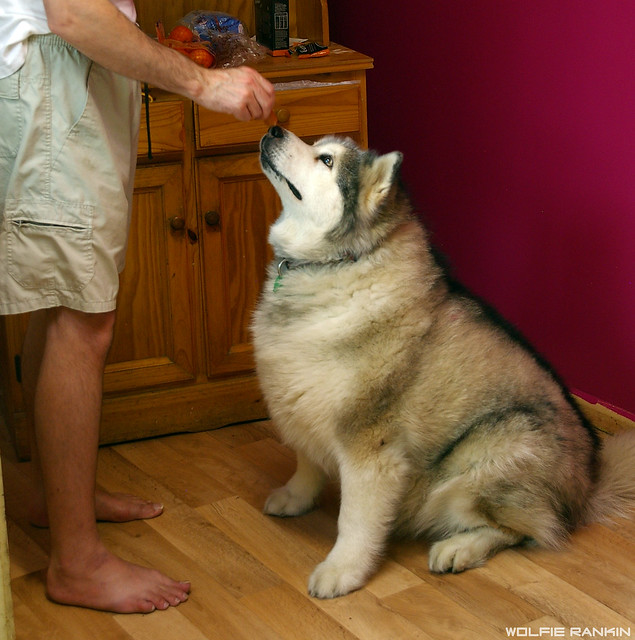

In [17]:
# %cd /content/clipseg
print(os.getcwd())
# Upload your sampel image
input_image = Image.open('../husky.jpeg')

# Normalize
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.Resize((512, 512)),
])
img = transform(input_image).unsqueeze(0)

input_image

In [18]:
prompts = ['husky']
num_of_p = len(prompts)

# predict
with torch.no_grad():
  preds = model(img.repeat(num_of_p,1,1,1), prompts)[0]

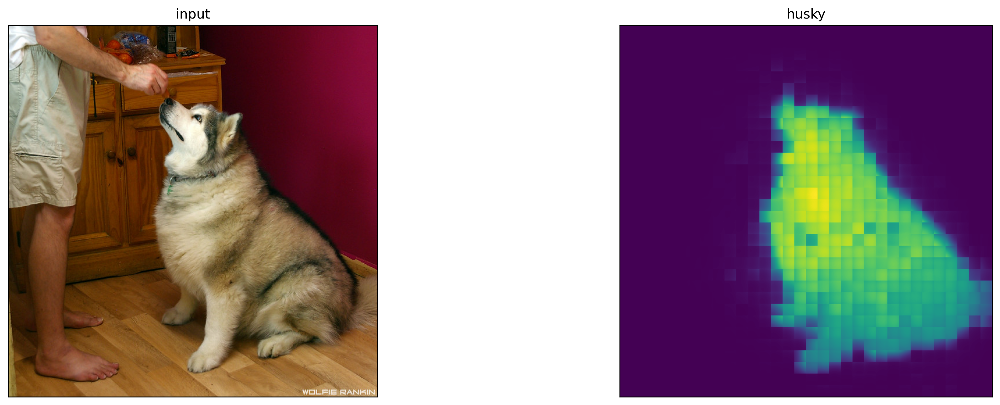

In [19]:
fig = plt.figure(num=None, figsize=(18, 6), dpi=256)

for i in range(num_of_p+1):
  ax = fig.add_subplot(1, num_of_p+1, i+1, xticks=[], yticks=[])
  
  if i == 0:
    plt.imshow(input_image)
    ax.set_title("input")
  else:
    plt.imshow(torch.sigmoid(preds[i-1][0]))
    ax.set_title(prompts[i-1])

In [20]:
import cv2
import numpy as np

In [21]:
# Generate and format mask for export
with torch.no_grad():
    preds = model(img.repeat(len(prompts),1,1,1), prompts)[0]
# init_image = img.convert('RGB').resize((512, 512))
filename = "sample.png"
plt.imsave(filename,torch.sigmoid(preds[0][0]))
img2 = cv2.imread(filename)
gray_image = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
(thresh, bw_image) = cv2.threshold(gray_image, 100, 255, cv2.THRESH_BINARY)
cv2.cvtColor(bw_image, cv2.COLOR_BGR2RGB)
output_mask = Image.fromarray(np.uint8(bw_image)).convert('RGB')

In [22]:
output_mask
output_mask = output_mask.save("../husky_mask.jpg")

# Inpainting

In [ ]:
!pip install -qq -U diffusers==0.11.1 transformers ftfy gradio accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.9/524.9 kB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 96.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 81.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 215.3/215.3 kB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.1/200.1 kB 25.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 108.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.5/140.5 kB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 kB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.3/75.3 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 64.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 kB 6.8 MB/s eta 0:

In [ ]:
import inspect
from typing import List, Optional, Union

import numpy as np
import torch

import PIL
import gradio as gr
from diffusers import StableDiffusionInpaintPipeline

In [ ]:
device = "cuda"
model_path = "runwayml/stable-diffusion-inpainting"

pipe = StableDiffusionInpaintPipeline.from_pretrained(
    model_path,
    torch_dtype=torch.float16,
).to(device)

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


In [ ]:
import requests
from io import BytesIO

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = PIL.Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid


def download_image(url):
    response = requests.get(url)
    return PIL.Image.open(BytesIO(response.content)).convert("RGB")

img_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo.png"
mask_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo_mask.png"

/content/clipseg


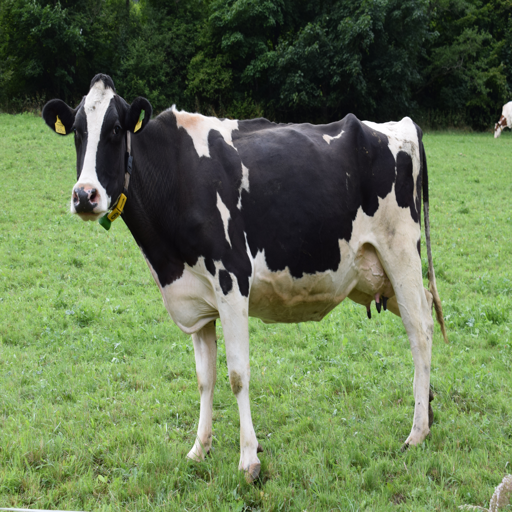

In [ ]:
print(os.getcwd())
image = PIL.Image.open('../cow.jpg').resize((512, 512))
image

  0%|          | 0/50 [00:00<?, ?it/s]

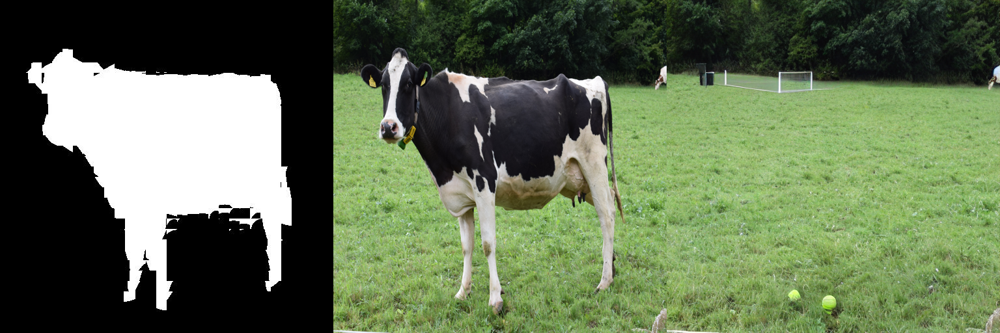

In [ ]:
mask_image = PIL.Image.open('/content/mask.jpg').resize((512, 512))
prompt = "tennis ball"

guidance_scale=7.5
num_samples = 1
generator = torch.Generator(device="cuda").manual_seed(0) # change the seed to get different results

images = pipe(
    prompt=prompt,
    image=image,
    mask_image=mask_image,
    guidance_scale=guidance_scale,
    generator=generator,
    num_images_per_prompt=num_samples,
).images

# insert initial image in the list so we can compare side by side
images.insert(0, image)
images.insert(0, mask_image)

image_grid(images, 1, num_samples + 2)

  0%|          | 0/50 [00:00<?, ?it/s]

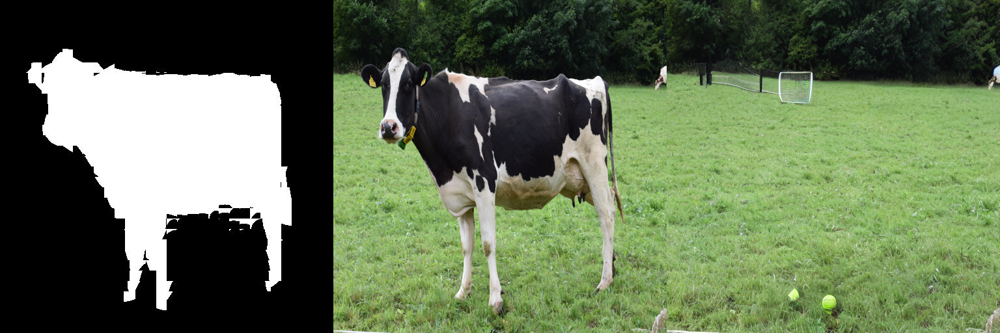

In [ ]:
mask_image = PIL.Image.open('/content/mask.jpg').resize((512, 512))
prompt = "one tennis ball"

guidance_scale=7.5
num_samples = 1
generator = torch.Generator(device="cuda").manual_seed(0) # change the seed to get different results

images = pipe(
    prompt=prompt,
    image=image,
    mask_image=mask_image,
    guidance_scale=guidance_scale,
    generator=generator,
    num_images_per_prompt=num_samples,
).images

# insert initial image in the list so we can compare side by side
images.insert(0, image)
images.insert(0, mask_image)

image_grid(images, 1, num_samples + 2)

  0%|          | 0/50 [00:00<?, ?it/s]

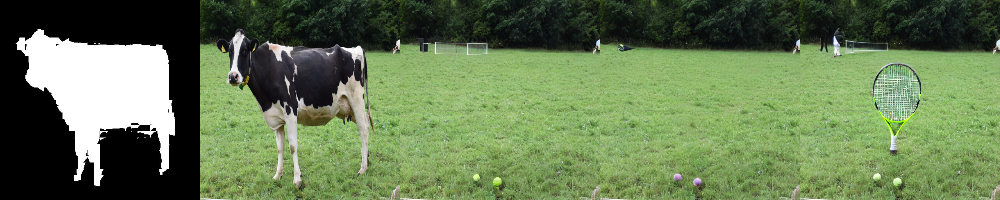

In [ ]:
mask_image = PIL.Image.open('/content/mask.jpg').resize((512, 512))
prompt = "a single tennis ball"

guidance_scale=7.5
num_samples = 3
generator = torch.Generator(device="cuda").manual_seed(0) # change the seed to get different results

images = pipe(
    prompt=prompt,
    image=image,
    mask_image=mask_image,
    guidance_scale=guidance_scale,
    generator=generator,
    num_images_per_prompt=num_samples,
).images

# insert initial image in the list so we can compare side by side
images.insert(0, image)
images.insert(0, mask_image)

image_grid(images, 1, num_samples + 2)


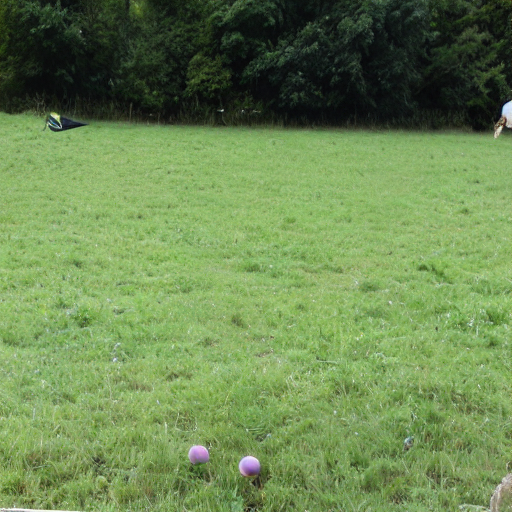

In [ ]:
input_image = images[3]

# Normalize
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.Resize((512, 512)),
])
img = transform(input_image).unsqueeze(0)

input_image

# Object Ratio

In [ ]:
print(os.getcwd())

/content/clipseg


In [ ]:
prompts = ['tennis ball']
num_of_p = len(prompts)

# predict
with torch.no_grad():
  preds = model(img.repeat(num_of_p,1,1,1), prompts)[0]

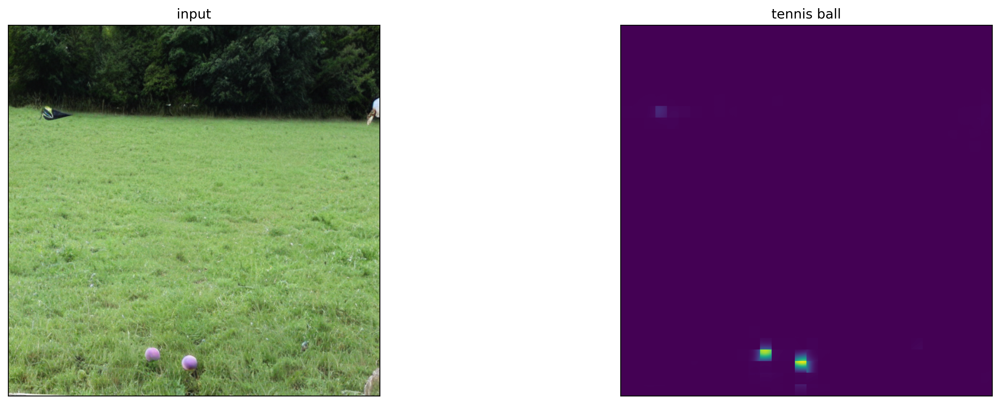

In [ ]:
fig = plt.figure(num=None, figsize=(18, 6), dpi=256)

for i in range(num_of_p+1):
  ax = fig.add_subplot(1, num_of_p+1, i+1, xticks=[], yticks=[])
  
  if i == 0:
    plt.imshow(input_image)
    ax.set_title("input")
  else:
    plt.imshow(torch.sigmoid(preds[i-1][0]))
    ax.set_title(prompts[i-1])

In [ ]:
# Generate and format mask for export
with torch.no_grad():
    preds = model(img.repeat(len(prompts),1,1,1), prompts)[0]
# init_image = img.convert('RGB').resize((512, 512))
filename = "sample.png"
plt.imsave(filename,torch.sigmoid(preds[0][0]))
img2 = cv2.imread(filename)
gray_image = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
(thresh, bw_image) = cv2.threshold(gray_image, 100, 255, cv2.THRESH_BINARY)
cv2.cvtColor(bw_image, cv2.COLOR_BGR2RGB)
output_mask = Image.fromarray(np.uint8(bw_image)).convert('RGB')


In [ ]:
replacing_obj_mask = output_mask.save("replacing_obj_mask.jpg")

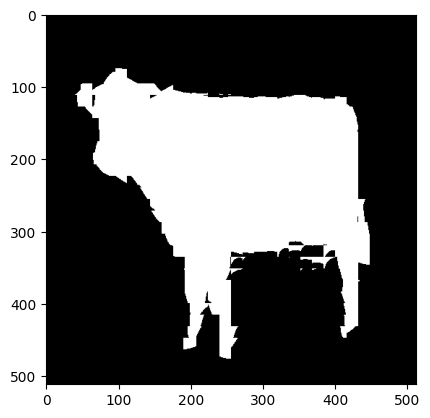

0.32892608642578125


In [ ]:
from matplotlib import pyplot as plt
img = cv2.imread("../mask.jpg", cv2.IMREAD_GRAYSCALE)
ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
plt.imshow(thresh1, 'gray', vmin=0, vmax=255)
plt.show()

ratio_white1 = cv2.countNonZero(img)/img.size
print(ratio_white1)

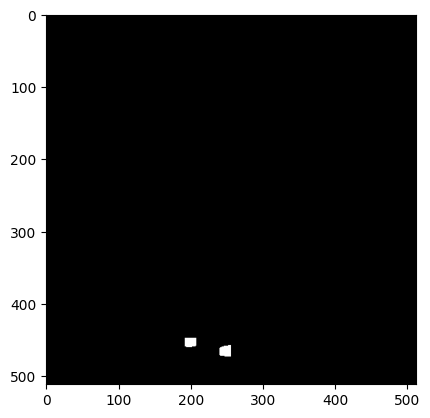

0.001964569091796875


In [ ]:
img = cv2.imread("replacing_obj_mask.jpg", cv2.IMREAD_GRAYSCALE)
ret,thresh2 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
plt.imshow(thresh2, 'gray', vmin=0, vmax=255)
plt.show()

ratio_white2 = cv2.countNonZero(img)/img.size
print(ratio_white2)

In [ ]:
print(ratio_white2/ratio_white1)

0.005972676454897595
